<a href="https://colab.research.google.com/github/mhuertascompany/EDE19/blob/master/tutorials/morphology/Galaxy_Morphology_Deep.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Galaxy Morphology with "classical ML" and deep learning

The goal of this tutorial is to illustrate a very basic supervised binary classification with different ML approaches. The goal is to setup a ML algorithm to determine the visual morphological type of nearby galaxies from the Sloan Digital Sky Survey. The first deep learning papers in Astronomy addressed this problem at low and high redshift (Dielemann+15, Huertas-Company+15).

![](https://drive.google.com/uc?id=1TaiRB1wxui4AKnhuF4iH4LJkmrlb-D6d)

The notebook illustrates first how to train a Random Forest and an Artifical Neural Network using catalog parameters (Stellar Mass and Color). The ML models are taken from scikitlearn.

Then we use a Convolutional Neural Network (deep learning) to learn the features directly from the images with no catalog information. The CNN  model is implemented here with Keras and a TensorFlow backend.  We use as training set, the visually classified sample of ~14,000 galaxies by Nair&Abraham. For illustration purposes, we use jpeg RGB images as input. However the same methodology can be applied to fits.

---



#### Before we start, make sure to open this Colab notebook in "PlayGround Mode" (top left) and to change the Runtime type to GPU by navigating to the toolbar and clicking Runtime -> Change runtime type and then changing Hardware accelerator to GPU

---

In [81]:
import numpy as np
from astropy.io import fits
from astropy.table import Table
import os
from sklearn import preprocessing
import pdb
import pickle
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.layers.normalization import  BatchNormalization
from keras.layers.convolutional import Convolution2D, MaxPooling2D
from keras.optimizers import rmsprop
import pdb
import time

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split


from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.callbacks import TensorBoard

from sklearn.metrics import roc_curve, precision_recall_curve, accuracy_score,auc

%pylab inline

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.6/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['clf']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


## Mount Drive

Before mounting the drive click on [this folder](https://drive.google.com/drive/folders/1PcftgBzBySo1Ync-Wdsp9arTCJ_MfEPE?usp=sharing) and add it to your google drive by following these steps:

*   Go to your drive 
*   Find shared folder ("Shared with me" link)
*   Right click it
*   Click Add to My Drive



In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


---
#### The notenook is setup to illustrate 2 different classifications:


#### 1.   Early vs. Late: This is an easy example in which we only try to separate between early-type and late-type galaxies.

#### 2.   E vs. S0: The second example is more challenging. We try to separate ellipticals from S0s.

#### By default case 1 is turn on. In order to switch to case 2 set the variable CLASS_EARLY_LATE to False.

---





In [0]:
CLASS_EARLY_LATE=True

## Classical ML (RF and ANN)

### Load data and prepare data

For the classical approaches, the input are catalog parameters (color, mass for illustration) which correlate with galaxy morphology. It is well known that early type galaxies are redder and more massive than late type galaxies. So we are going to exploit these correlation to estimate the galaxy morphology.

In [0]:
pathinData="/content/drive/My Drive/EDE2019/morphology"

if CLASS_EARLY_LATE:
  # donwload feature vector and labels
  X_ML = np.load(pathinData+'/feature_E_S.npy')
  #morphological class
  Y_ML = np.load(pathinData+'/label_E_S.npy') 
  #we also load images (for visualization purposes - not used for training)
  I_ML=np.load(pathinData+'/images_ML.npy') 

  

else:
  # donwload feature vector and labels
  X_ML = np.load(pathinData+'/feature_E_S0.npy')
  #morphological class
  Y_ML = np.load(pathinData+'/label_E_S0.npy') 
  #we also load images (for visualization purposes - not used for training)
  I_ML=np.load(pathinData+'/images_ML_E_S0.npy') 
  
#split training and test datasets
X_ML_train = X_ML[0:len(X_ML)//5*4,:]   
X_ML_test = X_ML[len(X_ML)//5*4:,:]
Y_ML_train = Y_ML[0:len(Y_ML)//5*4]
Y_ML_test = Y_ML[len(Y_ML)//5*4:]
I_ML_train = I_ML[0:len(I_ML)//5*4,:,:,:]
I_ML_test = I_ML[len(Y_ML)//5*4:,:,:,:]


### Visualize some images for illustration

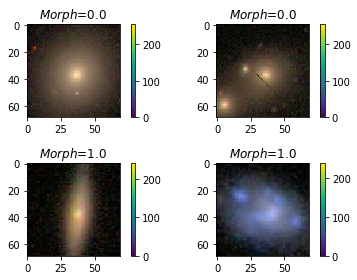

In [66]:
randomized_inds_train = np.random.permutation(len(I_ML))

fig = plt.figure()
for i,j in zip(randomized_inds_train[0:4],range(4)):
  ax = fig.add_subplot(2, 2, j+1)
  im = ax.imshow(I_ML[i,:,:].astype(int))
  plt.title('$Morph$='+str(Y_ML[i]))
  fig.tight_layout() 
  fig.colorbar(im)


### Visualize the feature space used for classification (Stellar Mass / Color)

For the classical ML classification we are going to use 2 catalog parameters only (stellar mass and color). This means that all the information contained in the images is reduced to 2 parameters (features) which is what the algorithms see and will use for classification. The following cell plots these parameters for both classes. The two different classes are expected to have different distributions in the feature space so that the ML algorithm can partition the space.

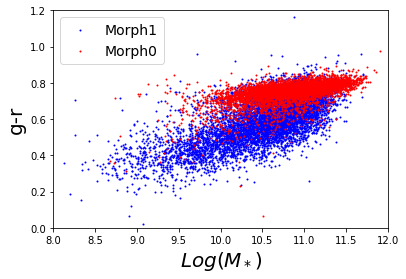

In [67]:
xlabel("$Log(M_*)$", fontsize=20)
ylabel("g-r", fontsize=20)
xlim(8,12)
ylim(0,1.2)
scatter(X_ML[Y_ML==1,1],X_ML[Y_ML==1,0],color='blue',s=1,label='Morph1')
scatter(X_ML[Y_ML==0,1],X_ML[Y_ML==0,0],color='red',s=1,label='Morph0')
legend(fontsize=14)

### Train RF classifier
We firsty train a RF classifier. The classifer takes as input the 2 parameters (Stellar Mass and Color) and tries to predict the visual morphology. We use here a depth of 5 and default settings. You can change the parameters and explore the effects.

In [69]:
clf = RandomForestClassifier(max_depth=5, random_state=0)
clf.fit(X_ML_train, Y_ML_train)
print("Trained RF Classifier")
print(clf)
print("Importance of each feature")
print(clf.feature_importances_)

Trained RF Classifier
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=5, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)
Importance of each feature
[0.85470844 0.14529156]


/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


### Train ANN
The second "classical" algorithm we test is an Artificial Neural Network which again takes as input 2 parameters. We use here an architecture with only one hdden layer. This can also be changed to explore the effects.

In [70]:
# some hyperparamters to be changed
nb_epoch=50
batch_size=50

# nueral network with 1 hidden layer of 5 neurons. You can add/remove layers and see the performance. Also change the optimizers.
ann = Sequential()
ann.add(Flatten(input_shape=(2,1)))
ann.add(Dense(5,activation='relu'))
ann.add(Dense(1,activation="sigmoid"))
ann.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
Xexp=np.expand_dims(X_ML_train,2)
print(Xexp.shape)
ann.fit(Xexp,Y_ML_train,nb_epoch=nb_epoch,batch_size=50)

(9384, 2, 1)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  if sys.path[0] == '':


Epoch 1/50
9384/9384 [==============================] - 2s 184us/step - loss: 0.6901 - acc: 0.5598
Epoch 2/50
9384/9384 [==============================] - 1s 92us/step - loss: 0.6876 - acc: 0.5598
Epoch 3/50
9384/9384 [==============================] - 1s 91us/step - loss: 0.6873 - acc: 0.5598
Epoch 4/50
9384/9384 [==============================] - 1s 90us/step - loss: 0.6868 - acc: 0.5598
Epoch 5/50
9384/9384 [==============================] - 1s 93us/step - loss: 0.6864 - acc: 0.5598
Epoch 6/50
9384/9384 [==============================] - 1s 89us/step - loss: 0.6854 - acc: 0.5598
Epoch 7/50
9384/9384 [==============================] - 1s 91us/step - loss: 0.6837 - acc: 0.5598
Epoch 8/50
9384/9384 [==============================] - 1s 92us/step - loss: 0.6808 - acc: 0.5598
Epoch 9/50
9384/9384 [==============================] - 1s 90us/step - loss: 0.6767 - acc: 0.5598
Epoch 10/50
9384/9384 [==============================] - 1s 91us/step - loss: 0.6710 - acc: 0.5597
Epoch 11/50
9384/9

## Deep Learning (CNN)
This section illustrates how to use a Convolutional Neural Network to estimate the visual morphology. The input of the network are now the images themselves without parameters. The CNN then automatically extracts the features. This is the main difference between classical and deep learning.

### Data Download and Preparation

In [0]:
if CLASS_EARLY_LATE:
  #Load data
  pathinData="/content/drive/My Drive/EDE2019/morphology"

  #images
  X = np.load(pathinData+'/image_vector_E_S_10000.npy')
  #morphological class
  Y = np.load(pathinData+'/target_vector_E_S_10000.npy') 

else:
  #Load data
  pathinData="/content/drive/My Drive/EDE2019/morphology"

  #images
  X = np.load(pathinData+'/image_vector_E_S0_5250.npy')
  #morphological class
  Y = np.load(pathinData+'/target_vector_E_S0_5250.npy')


In [72]:
# Spliting in Training and Test datasets, 4/5 of galaxies for training, 1/5 for testing
x_train = X[0:len(X)//5*4,:,:,:]   
x_test = X[len(X)//5*4:,:,:,:]
t_train = Y[0:len(Y)//5*4]
t_test = Y[len(Y)//5*4:]
print ('Y_train.shape= ', t_train.shape)          
print(np.max(t_train),np.min(t_train))

Y_train.shape=  (8000,)
1.0 0.0


### Visualization of images

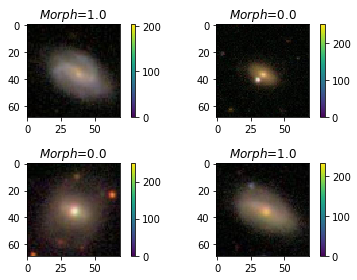

In [73]:
randomized_inds_train = np.random.permutation(len(x_train))

fig = plt.figure()
for i,j in zip(randomized_inds_train[0:4],range(4)):
  ax = fig.add_subplot(2, 2, j+1)
  im = ax.imshow(x_train[i,:,:].astype(int))
  plt.title('$Morph$='+str(t_train[i]))
  fig.tight_layout() 
  fig.colorbar(im)


### Pre-processing of images (Normlaziation)

In [0]:
mu = np.amax(x_train,axis=(1,2))
for i in range(0,mu.shape[0]):
    x_train[i,:,:,0] = x_train[i,:,:,0]/mu[i,0]
    x_train[i,:,:,1] = x_train[i,:,:,1]/mu[i,1]
    x_train[i,:,:,2] = x_train[i,:,:,2]/mu[i,2]
    
mu_test = np.amax(x_test,axis=(1,2))
for i in range(0,mu_test.shape[0]):
    x_test[i,:,:,0] = x_test[i,:,:,0]/mu_test[i,0]
    x_test[i,:,:,1] = x_test[i,:,:,1]/mu_test[i,1]
    x_test[i,:,:,2] = x_test[i,:,:,2]/mu_test[i,2]    


### Model definition
The following cell defines the model architecture. There is a Convolutional part made of multiple convolutinal layers with differnet depths and filter sizes. MaxPooling are used to reduce the sizes of tensors as we go deeper into the network. Batch Normalization and Dropout are use at the training phase to reduce over fitting.

In [0]:
def CNN_Nair(img_channels, img_rows, img_cols):
    
    # some hyperparamters you can chage
    dropoutpar=0.5
    depth=16   
    nb_dense = 64
    
    model=Sequential()
    model.add(Convolution2D(32, 6,6, border_mode='same',input_shape=(img_rows, img_cols,img_channels)))
    model.add(Activation('relu'))
    model.add(BatchNormalization())

    model.add(Convolution2D(64, 5, 5, border_mode='same'))
    model.add(Activation('relu'))
    
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())

    model.add(Convolution2D(64, 5, 5, border_mode='same'))
    model.add(Activation('relu'))
    
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())

    model.add(Convolution2D(128, 2, 2, border_mode='same'))
    model.add(Activation('relu'))
    
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(BatchNormalization())

    model.add(Convolution2D(128, 3, 3, border_mode='same'))
    model.add(Activation('relu'))
    
    model.add(BatchNormalization())
    

    model.add(Flatten())
    model.add(Dense(nb_dense, activation='relu'))
    model.add(Dropout(dropoutpar)) 
    model.add(Dense(1, init='uniform', activation='sigmoid'))
    print("Compilation...")
    model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])
    print("... done!")
    print("Model Summary")
    print("===================")
    model.summary()
    return model

This cell is to delete prevois runs if needed. Only run if you want to delete the results from previous runs.

In [0]:
RESET=True
if RESET:
  os.system("rm -r "+pathout)

Run this cell to launch a TensorBoard panel which will allow to follow the progress of the training of the deep neural network. Just run the cell and you should see an orange panel appearing. If not try again a second time.

In [77]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
%tensorboard --logdir morphology/models/model1

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1124), started 0:18:42 ago. (Use '!kill 1124' to kill it.)

Main code for training the CNN model defined previously. All outputs are stored in pathout. Change if you want to keep different models. BY default the dataset is augmented to reduce overfitting. You can turn it off be setting data_augmentation to False.

In [78]:
# train params - hardocded for simplicity - you can change them
pathout='morphology/models/model1' #output folder to store the results
model_name = '/model1'  #name of the final model which is saved in pathout

LOAD_MODEL=False

batch_size = 32 
nb_epoch = 20  #number of iterations for training - Can be changed
data_augmentation = True # if set to True the data will be augmented at every iteration


    
# input image dimensions
img_rows, img_cols = x_train.shape[1:3]
img_channels = 3

#Avoid more iterations once convergence
patience_par=10
earlystopping = EarlyStopping(monitor='val_loss',patience = patience_par,verbose=0,mode='auto' )
modelcheckpoint = ModelCheckpoint(pathout+model_name+"_best.hd5",monitor='val_loss',verbose=0,save_best_only=True)
tensorboard = TensorBoard(log_dir=pathout)

#build model
model=CNN_Nair(img_channels, img_rows, img_cols)
if LOAD_MODEL:
  model.load_weights(pathout+model_name+'.hd5')


if not data_augmentation:
  print('Not using data augmentation.')
  history = model.fit(x_train, t_train,
                            batch_size=batch_size,
                            nb_epoch=nb_epoch,
                            validation_data=(x_test, t_test),
                            shuffle=True,
                            verbose=verbose, callbacks=[earlystopping, modelcheckpoint,tensorboard])
else:
  print('Using real-time data augmentation.')

  # this will do preprocessing and realtime data augmentation
  datagen = ImageDataGenerator(
            featurewise_center=False, 
            samplewise_center=False, 
            featurewise_std_normalization=False, 
            samplewise_std_normalization=False,
            zca_whitening=False, 
            rotation_range=25,
            width_shift_range=0.1,  
            height_shift_range=0.1, 
            horizontal_flip=True,
            vertical_flip=True,
            zoom_range=[0.75,1.3])  

        
  datagen.fit(x_train)
        
  history = model.fit_generator(
                    datagen.flow(x_train, t_train, batch_size=batch_size),
                    samples_per_epoch=x_train.shape[0],
                    nb_epoch=nb_epoch,
                    validation_data=(x_test, t_test),
                    callbacks=[ earlystopping, modelcheckpoint,tensorboard]
                )



print("Saving model...")
model.save_weights(pathout+model_name+".hd5",overwrite=True)
    
        


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (6, 6), input_shape=(69, 69, 3..., padding="same")`
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (5, 5), padding="same")`
  del sys.path[0]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (5, 5), padding="same")`
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(128, (2, 2), padding="same")`
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(128, (3, 3), padding="same")`
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:40: UserWarning: Update your `Dense` call to the Keras 2 AP

Compilation...
... done!
Model Summary
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_21 (Conv2D)           (None, 69, 69, 32)        3488      
_________________________________________________________________
activation_21 (Activation)   (None, 69, 69, 32)        0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 69, 69, 32)        128       
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 69, 69, 64)        51264     
_________________________________________________________________
activation_22 (Activation)   (None, 69, 69, 64)        0         
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 34, 34, 64)        0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 3

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:59: UserWarning: The semantics of the Keras 2 argument `steps_per_epoch` is not the same as the Keras 1 argument `samples_per_epoch`. `steps_per_epoch` is the number of batches to draw from the generator at each epoch. Basically steps_per_epoch = samples_per_epoch/batch_size. Similarly `nb_val_samples`->`validation_steps` and `val_samples`->`steps` arguments have changed. Update your method calls accordingly.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:59: UserWarning: Update your `fit_generator` call to the Keras 2 API: `fit_generator(<keras_pre..., validation_data=(array([[[..., callbacks=[<keras.ca..., steps_per_epoch=250, epochs=20)`


Epoch 1/20
250/250 [==============================] - 20s 81ms/step - loss: 0.4463 - acc: 0.7990 - val_loss: 1.4862 - val_acc: 0.6900
Epoch 2/20
250/250 [==============================] - 19s 76ms/step - loss: 0.3866 - acc: 0.8380 - val_loss: 0.4233 - val_acc: 0.8265
Epoch 3/20
250/250 [==============================] - 19s 75ms/step - loss: 0.3480 - acc: 0.8540 - val_loss: 0.3364 - val_acc: 0.8515
Epoch 4/20
250/250 [==============================] - 19s 75ms/step - loss: 0.3271 - acc: 0.8666 - val_loss: 0.2635 - val_acc: 0.8950
Epoch 5/20
250/250 [==============================] - 19s 74ms/step - loss: 0.3121 - acc: 0.8756 - val_loss: 0.2738 - val_acc: 0.8800
Epoch 6/20
250/250 [==============================] - 18s 74ms/step - loss: 0.2953 - acc: 0.8756 - val_loss: 0.2826 - val_acc: 0.8850
Epoch 7/20
250/250 [==============================] - 18s 74ms/step - loss: 0.3013 - acc: 0.8796 - val_loss: 0.2626 - val_acc: 0.8885
Epoch 8/20
250/250 [==============================] - 18s 74ms

## Predictions and comparisons of different approaches
The following cells use the trained models (RF,ANN and CNN) to predict the morphological class of the test dataset and compare the performance of the different algorithms. 

In [79]:
print("Predicting...")
print("====================")
model.load_weights(pathout+model_name+".hd5")

Y_pred_RF=clf.predict_proba(X_ML_test)[:,1]
print(Y_pred_RF.shape)
Y_pred_ANN=ann.predict(np.expand_dims(X_ML_test,2))
Y_pred_DL = model.predict(x_test)


Predicting...
(2349,)


We now compute the global accuracy as well as ROC and P-R curves. If you are not familiar with these curves please see the lecture slides or click [here](https://en.wikipedia.org/wiki/Receiver_operating_characteristic) 

Global Accuracy RF: 0.8194976585781183
Global Accuracy ANN: 0.8250319284802043
Global Accuracy CNN: 0.8955
AUC RF: 0.891957677767029
AUC ANN: 0.8709953825974966
AUC CNN: 0.9628814332029271


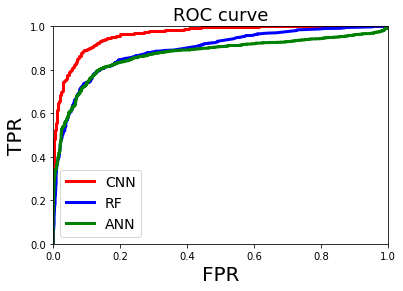

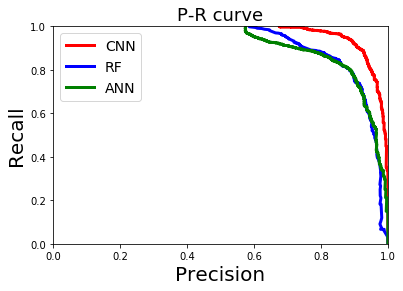

In [84]:
#global accuracy

Y_pred_RF_class=Y_pred_RF*0
Y_pred_RF_class[Y_pred_RF>0.5]=1


Y_pred_ANN_class=Y_pred_ANN*0
Y_pred_ANN_class[Y_pred_ANN>0.5]=1

Y_pred_DL_class=Y_pred_DL*0
Y_pred_DL_class[Y_pred_DL>0.5]=1

print("Global Accuracy RF:", accuracy_score(Y_ML_test, Y_pred_RF_class))
print("Global Accuracy ANN:", accuracy_score(Y_ML_test, Y_pred_ANN_class))
print("Global Accuracy CNN:", accuracy_score(t_test, Y_pred_DL_class))




# ROC curve (False positive rate vs. True positive rate)
fpr_DL, tpr_DL, thresholds_DL = roc_curve(t_test, Y_pred_DL)
fpr_RF, tpr_RF, thresholds_RF = roc_curve(Y_ML_test, Y_pred_RF)
fpr_ANN, tpr_ANN, thresholds_ANN = roc_curve(Y_ML_test, Y_pred_ANN)

print("AUC RF:", auc(fpr_RF, tpr_RF))
print("AUC ANN:", auc(fpr_ANN, tpr_ANN))
print("AUC CNN:", auc(fpr_DL, tpr_DL))

#plot ROC
fig = plt.figure() 
title('ROC curve',fontsize=18)
xlabel("FPR", fontsize=20)
ylabel("TPR", fontsize=20)
xlim(0,1)
ylim(0,1)
plot(fpr_DL,tpr_DL,linewidth=3,color='red',label='CNN')
plot(fpr_RF,tpr_RF,linewidth=3,color='blue',label='RF')
plot(fpr_ANN,tpr_ANN,linewidth=3,color='green',label='ANN')
legend(fontsize=14)


# Precision Recall curve (False positive rate vs. True positive rate)
precision_DL, recall_DL, thresholds_DL = precision_recall_curve(t_test, Y_pred_DL)
precision_RF, recall_RF, thresholds_RF = precision_recall_curve(Y_ML_test, Y_pred_RF)
precision_ANN, recall_ANN, thresholds_ANN = precision_recall_curve(Y_ML_test, Y_pred_ANN)
#plot PR curve
fig = plt.figure() 
title('P-R curve',fontsize=18)
xlabel("Precision", fontsize=20)
ylabel("Recall", fontsize=20)
xlim(0,1)
ylim(0,1)
plot(precision_DL,recall_DL,linewidth=3,color='red',label='CNN')
plot(precision_RF,recall_RF,linewidth=3,color='blue',label='RF')
plot(precision_ANN,recall_ANN,linewidth=3,color='green',label='ANN')
legend(fontsize=14)

The follwing cells visualize some random examples of bad classifications in order to explore what the network has understood. If you run multiple times the examples will change.

### Bad classifications of CNNs

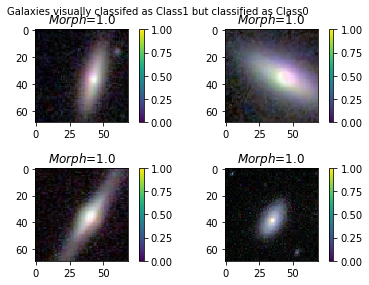

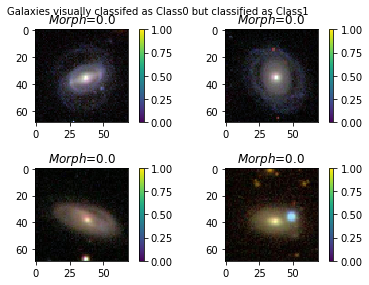

In [85]:
# objects classifed as early-types by the CNN but visually classifed as late-types
bad = np.where((Y_pred_DL[:,0]<0.5)&(t_test==1))
randomized_inds_train = np.random.permutation(bad)

fig = plt.figure()
fig.suptitle("Galaxies visually classifed as Class1 but classified as Class0",fontsize=10)
for i,j in zip(randomized_inds_train[0][0:4],range(4)):
  ax = fig.add_subplot(2, 2, j+1)
  im = ax.imshow(x_test[i,:,:])
  plt.title('$Morph$='+str(t_test[i]))
  fig.tight_layout() 
  fig.colorbar(im)



# objects classifed as late-types by the CNN but visually classifed as early-types
bad2 = np.where((Y_pred_DL[:,0]>0.5)&(t_test==0))
randomized_inds_train = np.random.permutation(bad2)

fig = plt.figure()
fig.suptitle("Galaxies visually classifed as Class0 but classified as Class1",fontsize=10)
for i,j in zip(randomized_inds_train[0][0:4],range(4)):
  ax = fig.add_subplot(2, 2, j+1)
  im = ax.imshow(x_test[i,:,:])
  plt.title('$Morph$='+str(t_test[i]))
  fig.tight_layout() 
  fig.colorbar(im)


### Bad classifcations of RFs

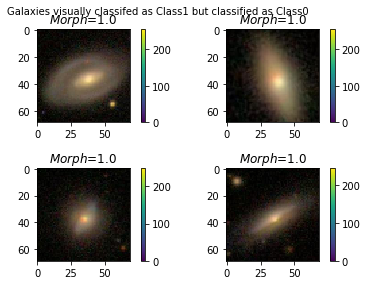

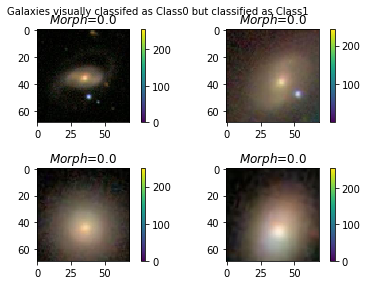

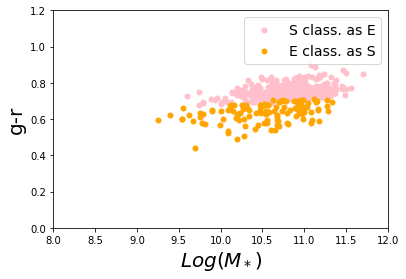

In [86]:
# objects classifed as early-types by the RF but visually classifed as late-types
bad = np.where((Y_pred_RF<0.5)&(Y_ML_test==1))
randomized_inds_train = np.random.permutation(bad)

fig = plt.figure()
fig.suptitle("Galaxies visually classifed as Class1 but classified as Class0",fontsize=10)
for i,j in zip(randomized_inds_train[0][0:4],range(4)):
  ax = fig.add_subplot(2, 2, j+1)
  im = ax.imshow(I_ML_test[i,:,:])
  plt.title('$Morph$='+str(Y_ML_test[i]))
  fig.tight_layout() 
  fig.colorbar(im)



# objects classifed as late-types by the CNN but visually classifed as early-types
bad2 = np.where((Y_pred_RF>0.5)&(Y_ML_test==0))
randomized_inds_train = np.random.permutation(bad2)

fig = plt.figure()
fig.suptitle("Galaxies visually classifed as Class0 but classified as Class1",fontsize=10)
for i,j in zip(randomized_inds_train[0][0:4],range(4)):
  ax = fig.add_subplot(2, 2, j+1)
  im = ax.imshow(I_ML_test[i,:,:])
  plt.title('$Morph$='+str(Y_ML_test[i]))
  fig.tight_layout() 
  fig.colorbar(im)
  
#visualize the feature space
fig = plt.figure()
xlabel("$Log(M_*)$", fontsize=20)
ylabel("g-r", fontsize=20)
xlim(8,12)
ylim(0,1.2)
scatter(X_ML_test[bad[0],1],X_ML_test[bad[0],0],color='pink',s=25,label="S class. as E")
scatter(X_ML_test[bad2[0],1],X_ML_test[bad2[0],0],color='orange',s=25,label='E class. as S') 
legend(fontsize=14)

### Bad classifications of ANNs

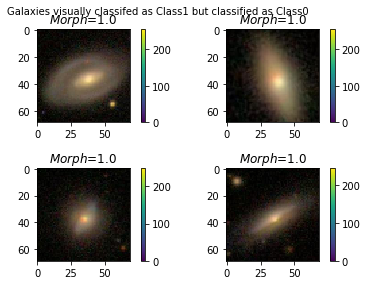

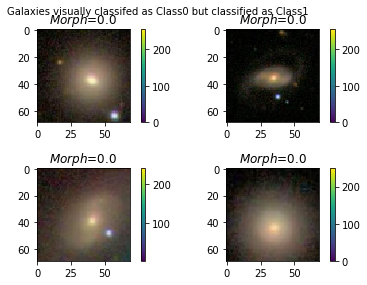

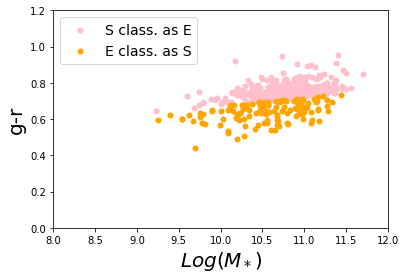

In [87]:
# objects classifed as early-types by the ANN but visually classifed as late-types
bad = np.where((Y_pred_ANN[:,0]<0.5)&(Y_ML_test==1))
randomized_inds_train = np.random.permutation(bad)

fig = plt.figure()
fig.suptitle("Galaxies visually classifed as Class1 but classified as Class0",fontsize=10)
for i,j in zip(randomized_inds_train[0][0:4],range(4)):
  ax = fig.add_subplot(2, 2, j+1)
  im = ax.imshow(I_ML_test[i,:,:])
  plt.title('$Morph$='+str(Y_ML_test[i]))
  fig.tight_layout() 
  fig.colorbar(im)



# objects classifed as late-types by the ANN but visually classifed as early-types
bad2 = np.where((Y_pred_ANN[:,0]>0.5)&(Y_ML_test==0))
randomized_inds_train = np.random.permutation(bad2)

fig = plt.figure()
fig.suptitle("Galaxies visually classifed as Class0 but classified as Class1",fontsize=10)
for i,j in zip(randomized_inds_train[0][0:4],range(4)):
  ax = fig.add_subplot(2, 2, j+1)
  im = ax.imshow(I_ML_test[i,:,:])
  plt.title('$Morph$='+str(Y_ML_test[i]))
  fig.tight_layout() 
  fig.colorbar(im)
  
#visualize the feature space
fig = plt.figure()
xlabel("$Log(M_*)$", fontsize=20)
ylabel("g-r", fontsize=20)
xlim(8,12)
ylim(0,1.2)
scatter(X_ML_test[bad[0],1],X_ML_test[bad[0],0],color='pink',s=25,label="S class. as E")
scatter(X_ML_test[bad2[0],1],X_ML_test[bad2[0],0],color='orange',s=25,label='E class. as S') 
legend(fontsize=14)